In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import sys
import os
import caffe
import time
import glob
import scipy
import csv
import itertools
from natsort import natsorted

In [2]:
# Set the csv limitation 
maxInt = sys.maxsize
decrement = True

while decrement:
    # decrease the maxInt value by factor 10 
    # as long as the OverflowError occurs.

    decrement = False
    try:
        csv.field_size_limit(maxInt)
    except OverflowError:
        maxInt = int(maxInt/10)
        decrement = True

In [3]:
def read_files(path,fileType):
    dimg_files = []
    for root, directories, filenames in os.walk(path):
        for filename in filenames:
            if fileType in filename:
                dimg_files.append(os.path.join(root,filename))
    return dimg_files

In [4]:
def getfrombigtxt(fname, delimiter=' '):
    tmp = []
    with open(fname, 'r') as f: # note text mode, not binary
        for row in csv.reader(f):
            for elements in row[0].split(delimiter):
#                 tmp.append(map(float, elements))
                tmp.append((elements))
    del tmp[-1]
    return np.asarray(tmp,dtype=np.float32)

In [5]:
def get_image_path(basename,path,ext):
    return(path + os.path.basename(basename).split('.')[0] + ext)

In [6]:
def loss_rate(arr1, arr2):
#     print arr1, arr2
    return np.sum(np.absolute(np.subtract(arr1,arr2)))/len(arr2)

In [7]:
def cross_entropy(predictions, targets, epsilon=1e-12):
    """
    Computes cross entropy between targets (encoded as one-hot vectors)
    and predictions. 
    Input: predictions (N, k) ndarray
           targets (N, k) ndarray        
    Returns: scalar
    """
    predictions = np.clip(predictions, epsilon, 1. - epsilon)
    N = predictions.shape[0]
    ce = -np.sum(np.sum(targets*np.log(predictions+1e-9)))/N
    return ce

In [8]:
# function is to show layer data by gray image
def show_data(data, padsize=1, padval=0, filename= 'test'):
    data = (data - data.min()) / (data.max() - data.min())
    
    # force the number of filters to be square
    n = int(np.ceil(np.sqrt(data.shape[0])))
    padding = ((0, n ** 2 - data.shape[0]), (0, padsize), (0, padsize)) + ((0, 0),) * (data.ndim - 3)
    data = np.pad(data, padding, mode='constant', constant_values=(padval, padval))
    
    # tile the filters into an image
    data = data.reshape((n, n) + data.shape[1:]).transpose((0, 2, 1, 3) + tuple(range(4, data.ndim + 1)))
    data = data.reshape((n * data.shape[1], n * data.shape[3]) + data.shape[4:])
    plt.figure()
    plt.imshow(data,cmap='gray')
    # save image 
#     plt.savefig(filename +".png") 
    plt.axis('on')
plt.rcParams['figure.figsize'] = (8, 8)
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

In [9]:
def caffe_inference(image_path, model_def = 'prototxt/yolo_tiny_deploy_10.prototxt'  , weight = 'weight/yolo_tiny.caffemodel'):
    
    # Configure
    pycaffe_dir = '/home/caslab/workspace/caffe/caffe/python/'
    model_dir = '/home/caslab/workspace/NVDLA/sw_6_1/prebuilt/linux/model/yolo'
    input_file = image_path
    model_def = os.path.join(model_dir,model_def)
    pretrained_model = os.path.join(model_dir, weight)
    gpu = False
    center_only = True
    images_dim = '448,448'
    mean_file = None
    # input_scale = 
    raw_scale = 255.0
    channel_swap = '2,1,0'
    ext = 'jpg'
    image_dims = [int(s) for s in images_dim.split(',')]
    mean, channel_swap_arr = None, None
    
    
    
    # Setup parameter
    if mean_file:
        mean = np.load(mean_file)
    if channel_swap:
        channel_swap_arr = [int(s) for s in channel_swap.split(',')]
    if gpu:
        caffe.set_mode_gpu()
    else:
        caffe.set_mode_cpu()

    
    # Create classifier class
    classifier = caffe.Classifier(model_def, pretrained_model,
            image_dims=image_dims, mean=mean,
            raw_scale=raw_scale,
            channel_swap=channel_swap_arr)


    
    # Load image file.
    inputs =[caffe.io.load_image(input_file)]
    load_img_time_end = time.time()

    # Classify
    predictions = classifier.predict(inputs, not center_only)
    
    return predictions[0]

In [10]:
image_path = '/home/caslab/workspace/NVDLA/sw_6_1/prebuilt/linux/image/dog448.jpg'
dimg_root_path = '/home/caslab/workspace/NVDLA/sw_6_1/prebuilt/linux/runtime/yolo_dimg_each_448/'
dimg_files =  natsorted(read_files(dimg_root_path,'dimg'))

test_name = []
nvdla_result = []
nvdla_feature = []
caffe_result = []
caffe_flatten = []
nvdla_last_result = getfrombigtxt(dimg_files[0])
caffe_last_result = caffe_inference(image_path,"prototxt/"+os.path.basename(dimg_files[0]).split('.')[0]+".prototxt")

for element in dimg_files[1:-1]:
    prototxt_file = "prototxt/"+os.path.basename(element).split('.')[0]+".prototxt"
    test_name.append(prototxt_file)
    nvdla_tmp = getfrombigtxt(element)
    nvdla_result.append(nvdla_tmp)
    caffe_tmp = caffe_inference(image_path,prototxt_file)
    caffe_result.append(caffe_tmp)
    nvdla_feature.append(nvdla_tmp.reshape(len(caffe_tmp),len(caffe_tmp[0]),-1))
    caffe_flatten.append(caffe_tmp.flatten())

/usr/lib/pymodules/python2.7/matplotlib/pyplot.py:412: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


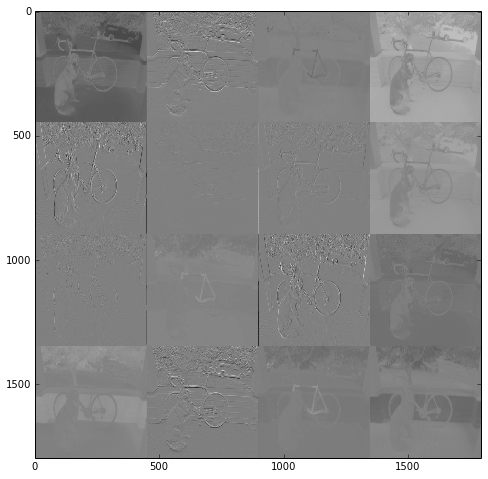

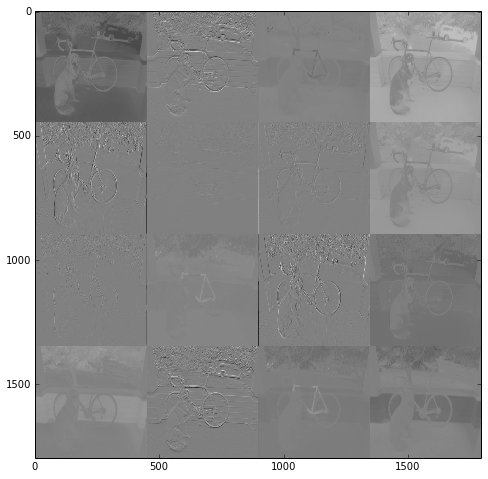

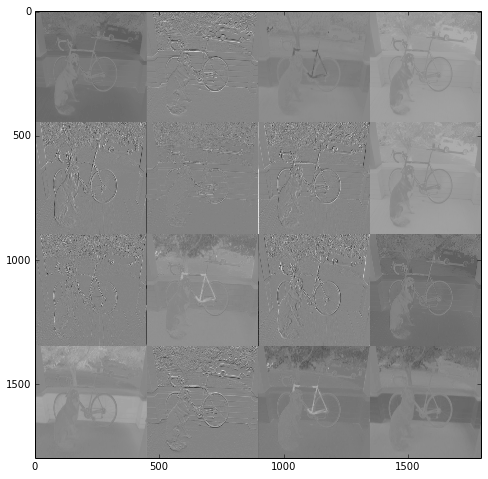

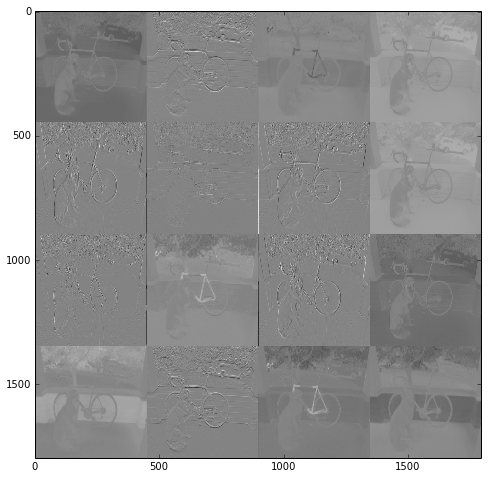

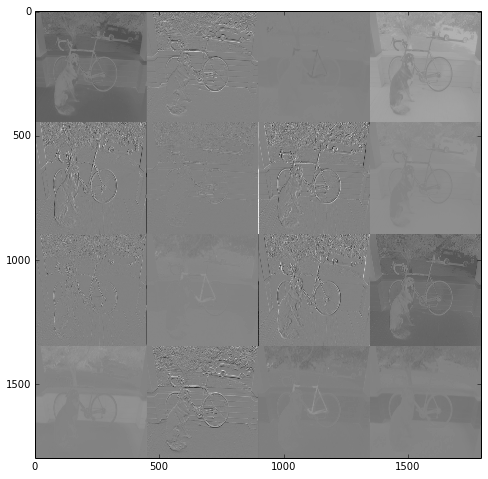

...

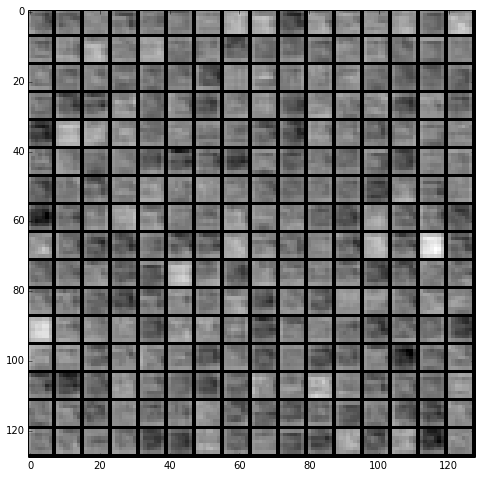

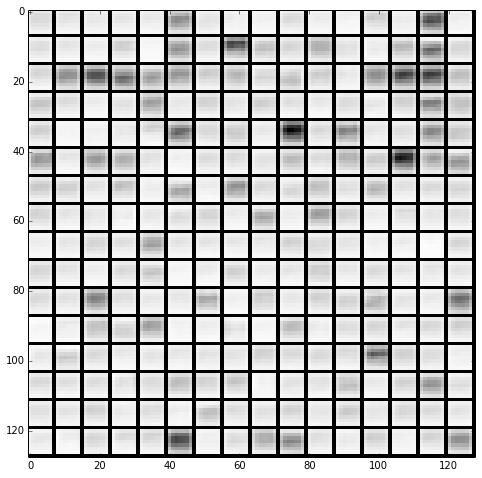

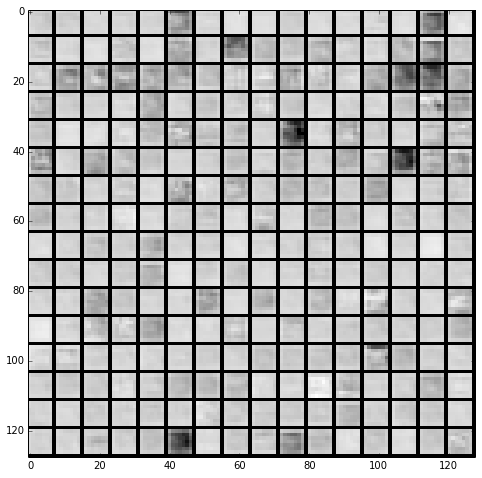

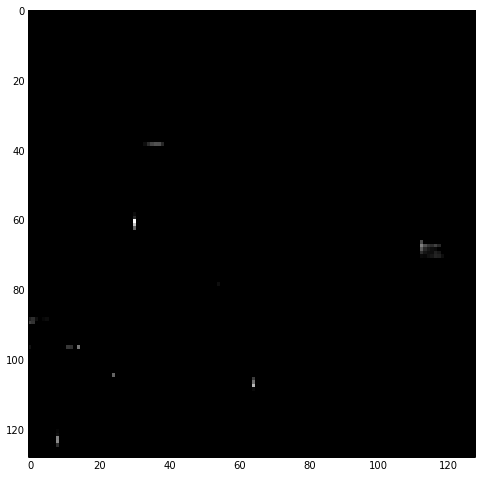

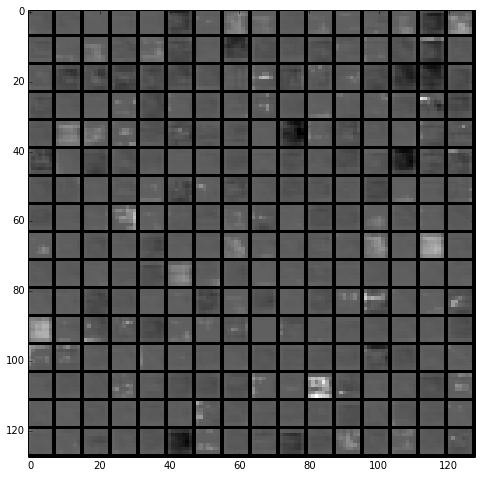

In [11]:
for i in range(0,len(test_name)):
    show_data(nvdla_feature[i],filename=os.path.basename(test_name[i])+'_nvdla')
    show_data(caffe_result[i],filename=os.path.basename(test_name[i])+'_caffe')

[00] loss: 0.44660,	0.02876%
[01] loss: 2.71626,	0.04519%
[02] loss: 9.52606,	0.03193%
[03] loss: 58.12061,	0.36098%
[04] loss: 48.47710,	0.31454%
[05] loss: 338.77882,	1.30751%
[06] loss: 102.77494,	1.86944%
[07] loss: 353.32414,	1.47502%
[08] loss: 145.48428,	1.99008%
[09] loss: 132.49566,	2.02280%
[10] loss: 300.98043,	6.04755%
[11] loss: 180.97172,	6.60852%
[12] loss: 589.15860,	6.56764%
[13] loss: 149.52918,	4.04958%
[14] loss: 175.11800,	4.86633%
[15] loss: 243.45518,	5.03061%
[16] loss: 127.81230,	5.52945%
[17] loss: 353.40605,	5.60585%
[18] loss: 91.83921,	3.60946%
[19] loss: 111.64631,	4.74495%
[20] loss: 175.18333,	8.57845%
[21] loss: 130.24399,	8.15532%
[22] loss: 292.64134,	7.60223%
[23] loss: 52.78326,	3.41327%
[24] loss: 57.87718,	3.82690%
[25] loss: 112.14980,	13.08585%
[26] loss: 137.03910,	15.25433%
[27] loss: 237.93363,	10.61162%
[28] loss: 31.27913,	3.36252%
[29] loss: 35.60237,	3.91214%
[30] loss: 38.45365,	5.58162%
[31] loss: 92.64938,	6.53824%
[32] loss: 528.24450

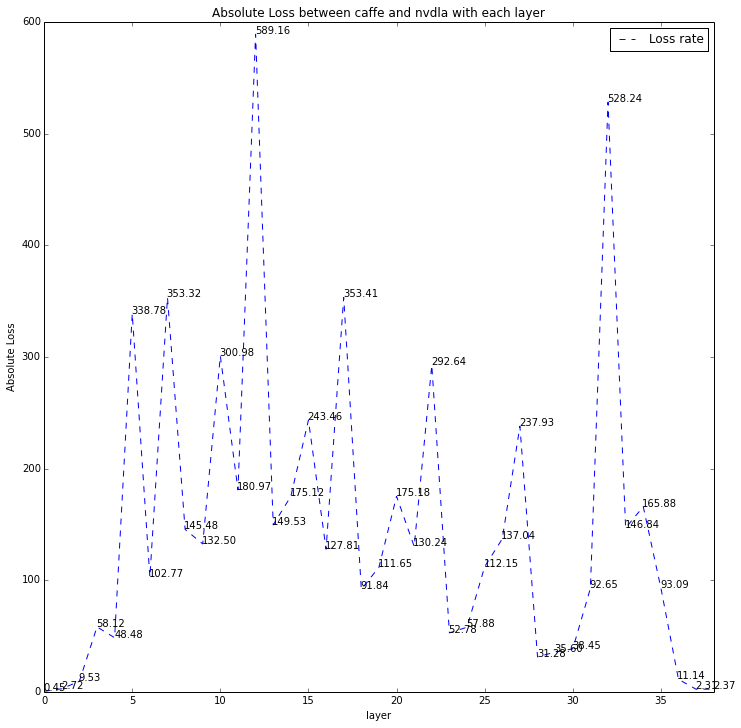

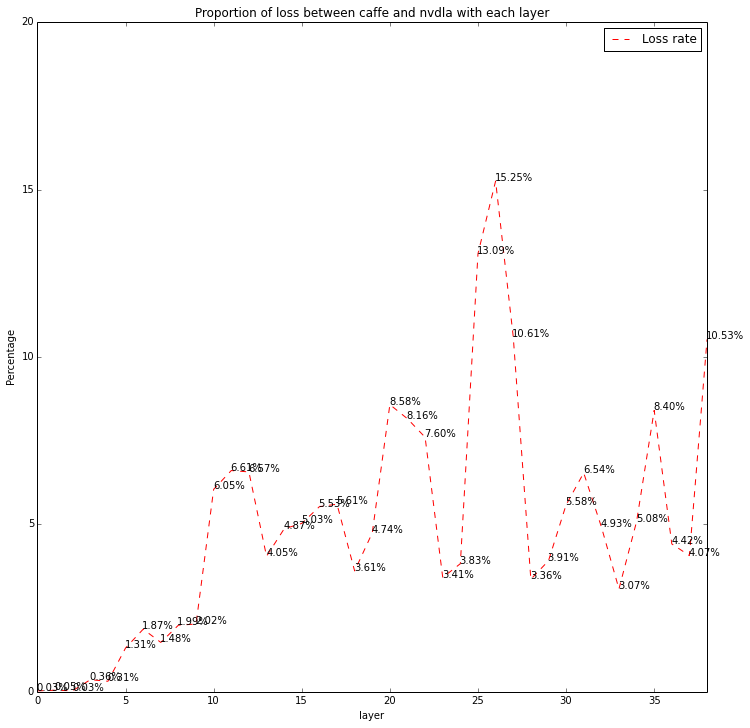

In [12]:

loss_caffe_nvdla = []
loss_percentage = []
for i in range(0,len(nvdla_result)):
    value_range = caffe_flatten[i].max() - caffe_flatten[i].min()
    tmp = loss_rate(nvdla_result[i],caffe_flatten[i])
    loss_caffe_nvdla.append(tmp)
    loss_percentage.append((tmp*100)/value_range)
    print("[%02d] loss: %.5f,\t%.5f%%"%(i,tmp,((tmp*100)/value_range)))

loss_tmp = loss_rate(nvdla_last_result,caffe_last_result.flatten())
value_range_tmp = caffe_last_result.flatten().max() - caffe_last_result.flatten().min()
loss_caffe_nvdla.append(loss_tmp)
loss_percentage.append((loss_tmp*100)/value_range_tmp)
print("[38] loss: %.5f,\t%.5f%%"%(loss_tmp,((loss_tmp*100)/value_range_tmp)))

pixel_width = 12
pixel_height = 12
plt.figure(figsize=(pixel_width, pixel_height))
aa = range(0,39)
l1, = plt.plot(aa,loss_caffe_nvdla,'--', label = 'Loss rate', color = 'blue')

plt.xlim((0, 38))
plt.ylim((0, 600))
plt.title("Absolute Loss between caffe and nvdla with each layer")
plt.xlabel('layer')
plt.ylabel('Absolute Loss')

plt.legend() #, labels = ['caffe', 'no mean'], loc = 'best')

for i,j in zip(aa,loss_caffe_nvdla):
    plt.annotate(str('%.2f' %j),xy=(i,j))

plt.show()

# ---------------------
plt.figure(figsize=(pixel_width, pixel_height))
aa = range(0,39)
l1, = plt.plot(aa,loss_percentage,'--', label = 'Loss rate', color = 'red')

plt.xlim((0, 38))
plt.ylim((0, 20))
plt.title("Proportion of loss between caffe and nvdla with each layer")
plt.xlabel('layer')
plt.ylabel('Percentage')

for i,j in zip(aa,loss_percentage):
    plt.annotate(str('%.2f%%' %j),xy=(i,j))

plt.legend() #, labels = ['caffe', 'no mean'], loc = 'best')

plt.show()

In [13]:
i = 36
aa = 0.0
for j in range(0,len(nvdla_result[i])):
    aa += np.absolute(nvdla_result[i][j]-caffe_flatten[i][j])
#     print("[%d] %3.5f - %3.5f = %3.5f"%(j,nvdla_result[i][j],caffe_flatten[i][j],(nvdla_result[i][j]-caffe_flatten[i][j])))
print aa/len(nvdla_result[i])

11.141719753944258
